# Plot basic things

This guide is organized as follows
- Horizontal maps
- Vertical slices
- Depth profiles

In this guide we will focus on how-to plot things using AIBECS' built-in recipes for [Plots.jl](https://github.com/JuliaPlots/Plots.jl).
These recipes are implemented using [RecipesBase.jl](https://github.com/JuliaPlots/RecipesBase.jl), which are explained in [Plots.jl's documentation](https://docs.juliaplots.org/latest/recipes/).

Throughout we will use the OCIM2 grid and we will create a `dummy` tracer as a function of location to showcase each plot, just for the sake of the examples herein.

In [1]:
using AIBECS, Plots
grd, _ = OCIM2.load()
dummy = cosd.(latvec(grd))

Loading OCIM2 ✔
┌ Info: You are about to use the OCIM2 (CTL with He) model.
│ If you use it for research, please cite:
│ 
│ - DeVries, T., & Holzer, M. (2019). Radiocarbon and helium isotope constraints on deep ocean ventilation and mantle‐³He sources. Journal of Geophysical Research: Oceans, 124, 3036–3057. https://doi.org/10.1029/2018JC014716 
│ 
│ You can find the corresponding BibTeX entries in the CITATION.bib file
│ at the root of the AIBECS.jl package repository.
│ (Look for the "DeVries_Holzer_2019" key.)
└ @ AIBECS.OCIM2 /Users/travis/build/briochemc/AIBECS.jl/src/OCIM2.jl:53


200160-element Array{Float64,1}:
 0.3221204417984906 
 0.3546048870425357 
 0.38666674294141884
 0.41826780077556525
 0.44937040096716135
 0.4799374779597864 
 0.5099326043901359 
 0.5393200344991993 
 0.5680647467311559 
 0.5961324854692254 
 ⋮                  
 0.8854560256532099 
 0.8688879687250066 
 0.9154080085253663 
 0.9009688679024191 
 0.8854560256532099 
 0.8688879687250066 
 0.9154080085253663 
 0.9009688679024191 
 0.8854560256532099 

## Horizontal plots

### Horizontal slice

The most common thing you plot after a simulation of marine tracers is a horizontal slice.
In this case, you just need to provide the tracer (`dummy` here), the grid object `grd`, and the depth at which you want to plot.

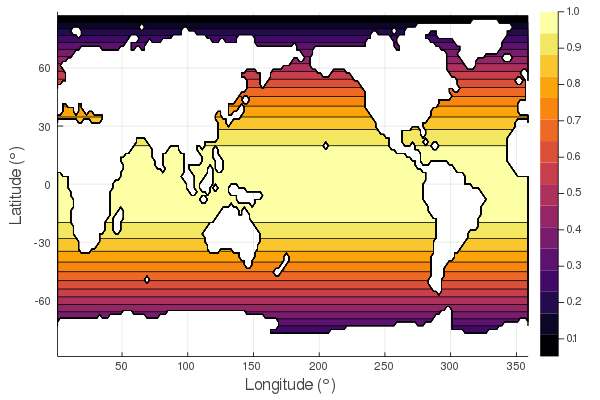

In [2]:
horizontalslice(dummy, grd, depth=10)

You can supply units for the depth at which you want to see the horizontal slice.

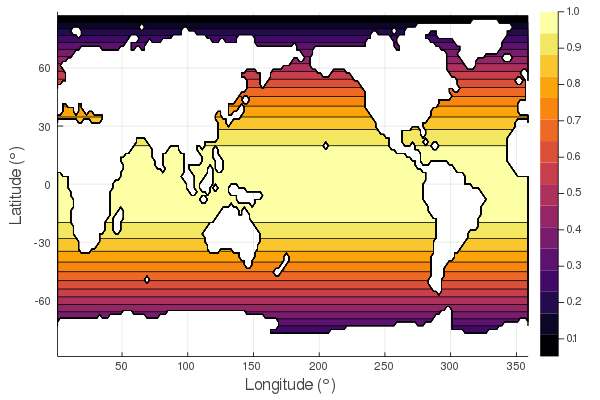

In [3]:
horizontalslice(dummy, grd, depth=10u"m")

And the units should be understood under the hood.

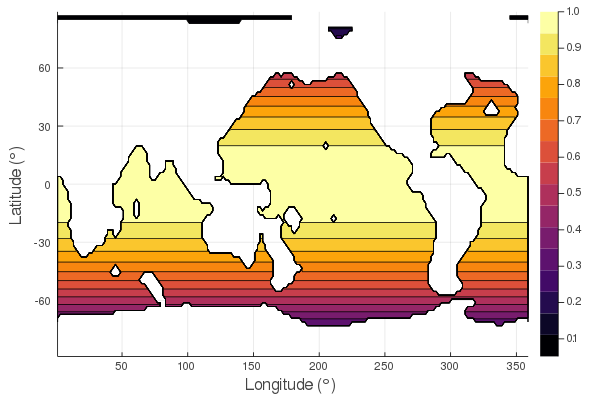

In [4]:
horizontalslice(dummy, grd, depth=3u"km")

If your tracer is supplied with units, those will show in the colorbar label

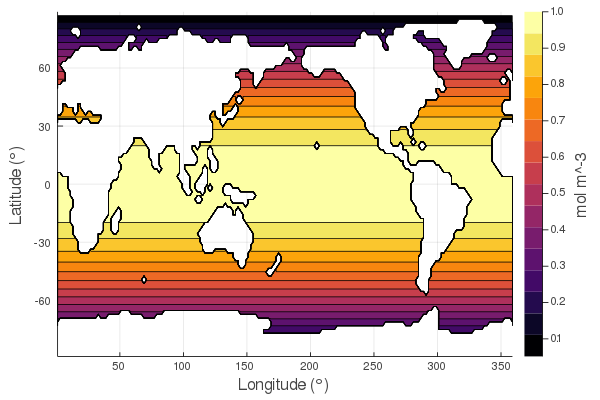

In [5]:
horizontalslice(dummy * u"mol/m^3", grd, depth=10u"m")

The advantage of Plots.jl recipes like this one is that you can specify other pieces of the plot as you would with built-in functions.
The advantage of Plots.jl recipes like this one is that you can specify other pieces of the plot as you would with built-in functions.
For example, you can chose the colormap with the `color` keyword argument.

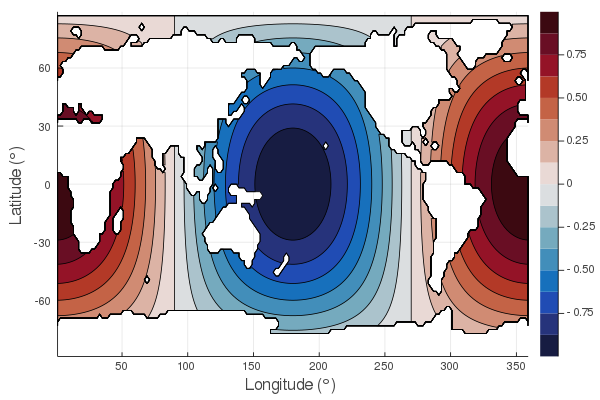

In [6]:
dummy .*= cosd.(lonvec(grd))
plt = horizontalslice(dummy, grd, depth=100, color=:balance)

And you can finetune attributes after the plot is created.

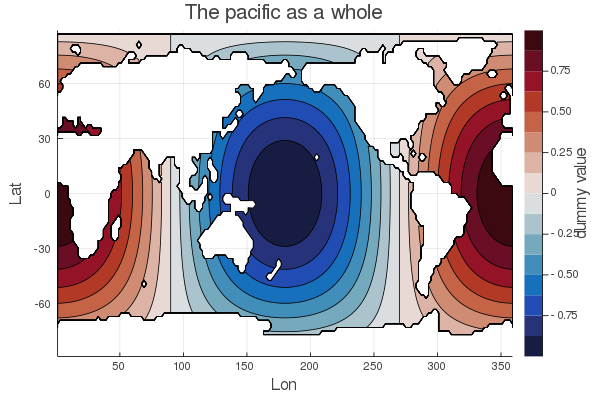

In [7]:
plot!(plt, xlabel="Lon", ylabel="Lat", colorbar_title="dummy value", title="The pacific as a whole")

## Vertical plots

Exploring the vertical distribution of tracers is important after all.

### Zonal slices

You must specify the longitude

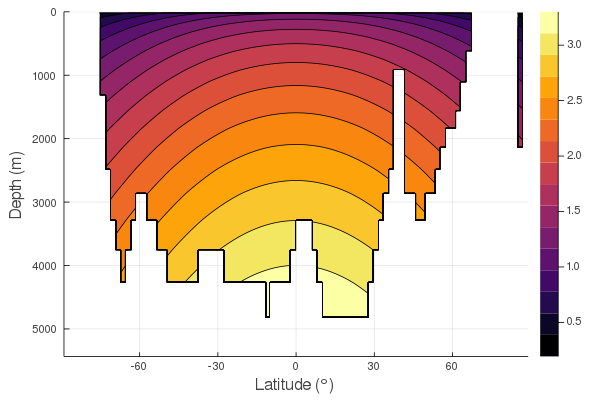

In [8]:
dummy .= cosd.(latvec(grd))
dummy .+= sqrt.(depthvec(grd)) / 30
zonalslice(dummy, grd, lon=330)

### Zonal averages

#### Global zonal average

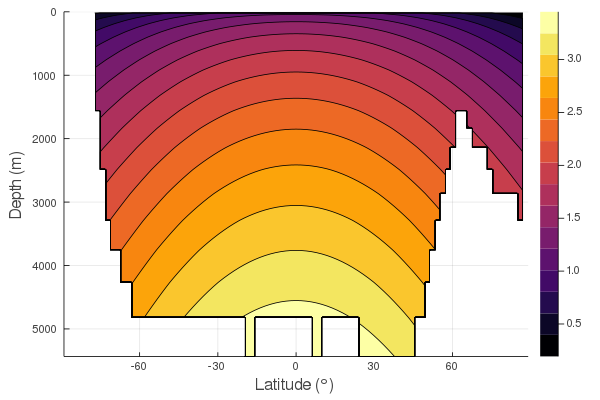

In [9]:
zonalaverage(dummy, grd)

If you want a zonal average over a specific region, you can just mask it out

#### Basin zonal average

This is experimental at this stage and relies on an unregistered package [OceanBasins](https://github.com/briochemc/OceanBasins.jl).
This part of the documentation will be *online* when [OceanBasins](https://github.com/briochemc/OceanBasins.jl) gets registered.

You can create basin masks using this package with

```
using OceanBasins
mPAC = ispacific(grd)[iwet]
surfacemap(mPAC, grd, seriestype=:heatmap, color=:lightrainbow)
zonalaverage(dummy, grd, mask=mPAC)
```

### Meridional slices

Just as you should expect at this stage, you can plot a meridional slice with

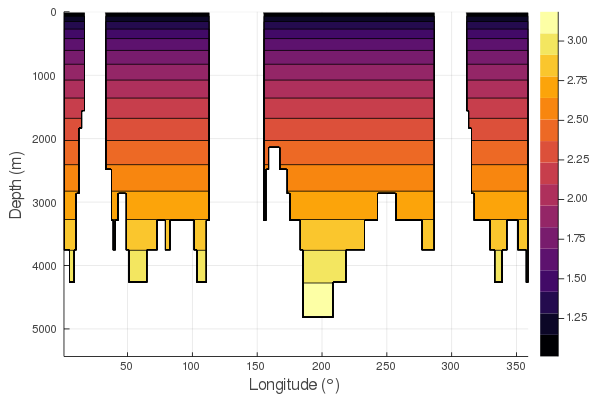

In [10]:
meridionalslice(dummy, grd, lat=-30)

## Depth profiles

Sometimes you want a profile at a given station or location

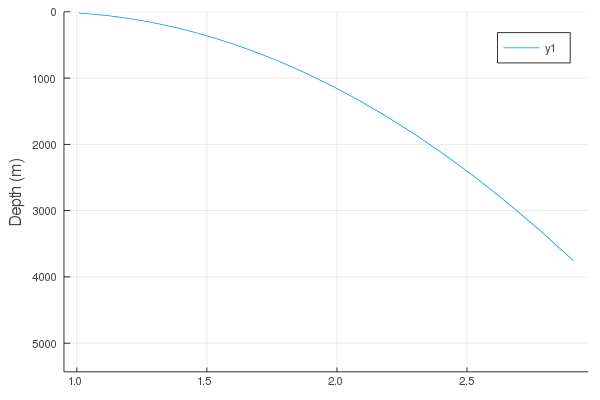

In [11]:
depthprofile(dummy, grd, lonlat=(-30,30))

---

*This notebook was generated using [Literate.jl](https://github.com/fredrikekre/Literate.jl).*